# Segmentation of Indian Traffic

In [ ]:
import math
from PIL import Image, ImageDraw
from PIL import ImagePath
import pandas as pd
import os
from os import path
from tqdm import tqdm
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib

<pre>
Directory Structure: 
|--- data
|-----| ---- images
|-----| ------|----- Scene 1
|-----| ------|--------| ----- Frame 1 (image 1)
|-----| ------|--------| ----- Frame 2 (image 2)
|-----| ------|--------| ----- ...
|-----| ------|----- Scene 2
|-----| ------|--------| ----- Frame 1 (image 1)
|-----| ------|--------| ----- Frame 2 (image 2)
|-----| ------|--------| ----- ...
|-----| ------|----- .....
|-----| ---- masks
|-----| ------|----- Scene 1
|-----| ------|--------| ----- json 1 (labeled objects in image 1)
|-----| ------|--------| ----- json 2 (labeled objects in image 1)
|-----| ------|--------| ----- ...
|-----| ------|----- Scene 2
|-----| ------|--------| ----- json 1 (labeled objects in image 1)
|-----| ------|--------| ----- json 2 (labeled objects in image 1)
|-----| ------|--------| ----- ...
|-----| ------|----- .....
</pre>

# Task 1: Preprocessing

## 1. Get all the file name and corresponding json files

In [ ]:
!gdown --id 1iQ93IWVdR6dZ6W7RahbLq166u-6ADelJ

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1iQ93IWVdR6dZ6W7RahbLq166u-6ADelJ
To: /content/data.zip
100% 2.34G/2.34G [00:22<00:00, 105MB/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile

with ZipFile('data.zip', 'r') as z:
    z.extractall()

In [ ]:
def return_file_names_df(root_dir):
    # create a dataframe with two columns ['images', 'json']
    # the column 'image' will have path to images
    # the column 'json' will have path to json files

    df = {}
    
    #create a list corresponding to each folder in root_dir
    subdir_list = os.listdir(root_dir)
    if subdir_list[0] != 'images':
        subdir_list = subdir_list[::-1]

    for folder in subdir_list:
        df[folder] = []
        #join the root_dir and folder to form a path 
        #walk through the folder and get path to all files 
        for root, subdirs, fnames in os.walk(os.path.join(root_dir, folder)):
            #append all the file paths to a list
            for fname in fnames:
                df[folder].append(os.path.join(root, fname))
        #sort the file paths alphabetically
        df[folder].sort()
    
    #create a dataframe from the dictionary
    data_df = pd.DataFrame(df)
    data_df.columns = ['image', 'json']
    return data_df

In [ ]:
root_dir = 'data'
data_df = return_file_names_df(root_dir)
data_df.head()

,image,json
0,data/images/201/frame0029_leftImg8bit.jpg,data/mask/201/frame0029_gtFine_polygons.json
1,data/images/201/frame0299_leftImg8bit.jpg,data/mask/201/frame0299_gtFine_polygons.json
2,data/images/201/frame0779_leftImg8bit.jpg,data/mask/201/frame0779_gtFine_polygons.json
3,data/images/201/frame1019_leftImg8bit.jpg,data/mask/201/frame1019_gtFine_polygons.json
4,data/images/201/frame1469_leftImg8bit.jpg,data/mask/201/frame1469_gtFine_polygons.json


> If you observe the dataframe, we can consider each row as single data point, where first feature is image and the second feature is corresponding json file

In [ ]:
data_df.shape

(4008, 2)

## 2. Structure of sample Json file

* Each File will have 3 attributes
    * imgHeight: which tells the height of the image
    * imgWidth: which tells the width of the image
    * objects: it is a list of objects, each object will have multiple attributes,
        * label: the type of the object
        * polygon: a list of two element lists, representing the coordinates of the polygon

#### Compute the unique labels

Let's see how many unique objects are there in the json file.

To see how to get the object from the json file refer <a href='https://www.geeksforgeeks.org/read-json-file-using-python/'>this blog </a>

In [ ]:
import json

In [ ]:
def return_unique_labels(data_df):
    # for each file in the column json
    #       read and store all the objects present in that file
    # compute the unique objects and retrun them
    # if open any json file using any editor you will get better sense of it
    unique_labels = set()
    
    for fname in data_df['json'].values:
        with open(fname) as f:
            dic = json.load(f)
            for obj in dic['objects']:
                unique_labels.add(obj['label'])

    return unique_labels

In [ ]:
unique_labels = return_unique_labels(data_df)

<img src='https://i.imgur.com/L4QH6Tp.png'>

In [ ]:
label_clr = {'road':10, 'parking':20, 'drivable fallback':20,'sidewalk':30,'non-drivable fallback':40,'rail track':40,\
                        'person':50, 'animal':50, 'rider':60, 'motorcycle':70, 'bicycle':70, 'autorickshaw':80,\
                        'car':80, 'truck':90, 'bus':90, 'vehicle fallback':90, 'trailer':90, 'caravan':90,\
                        'curb':100, 'wall':100, 'fence':110,'guard rail':110, 'billboard':120,'traffic sign':120,\
                        'traffic light':120, 'pole':130, 'polegroup':130, 'obs-str-bar-fallback':130,'building':140,\
                        'bridge':140,'tunnel':140, 'vegetation':150, 'sky':160, 'fallback background':160,'unlabeled':0,\
                        'out of roi':0, 'ego vehicle':170, 'ground':180,'rectification border':190,\
                   'train':200}

In [ ]:
len(set(label_clr.values()))

21

<pre>
* here we have given a number for each of object types, if you see we are having 21 different set of objects
* Note that we have multiplies each object's number with 10, that is just to make different objects look differently in the segmentation map
* Before we pass it to the models, we might need to divide the image array /10.
</pre>

## 3. Extracting the polygons from the json files

In [ ]:
def get_poly(file):
    # this function will take a file name as argument
    
    with open(file) as f:
        dic = json.load(f)

    # it will process all the objects in that file and returns
    
    # label: a list of labels for all the objects label[i] will have the corresponding vertices in vertexlist[i]
    # len(label) == number of objects in the image
    
    # vertexlist: it should be list of list of vertices in tuple formate 
    # ex: [[(x11,y11), (x12,y12), (x13,y13) .. (x1n,y1n)]
    #     [(x21,y21), (x22,y12), (x23,y23) .. (x2n,y2n)]
    #      .....
    #     [(xm1,ym1), (xm2,ym2), (xm3,ym3) .. (xmn,ymn)]]
    # len(vertexlist) == number of objects in the image

    # * note that label[i] and vertextlist[i] are corresponds to the same object, one represents the type of the object
    # the other represents the location

    label = []
    vertexlist = []

    for obj in dic['objects']:
        label.append(obj['label'])
        vertexlist.append(obj['polygon'])

    vertexlist = list(map(lambda x: [(i[0], i[1]) for i in x], vertexlist))

    # width of the image
    # height of the image

    h = dic['imgHeight']
    w = dic['imgWidth']
    
    return w, h, label, vertexlist

## 4. Creating Image segmentations by drawing set of polygons

### Trying out Image Segmentation on random data

(28, 28, 3)
[[0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0]
 [0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0]
 [0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0]
 [0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0]
 [0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 3 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0]
 [0 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0]
 [0 0 0 0 0 0 0 0 0 0 3 3 3 3 3 3 3 3 3 3 3 

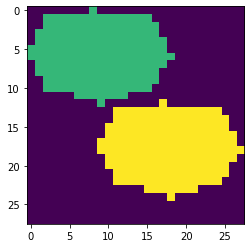

In [ ]:
import math 
from PIL import Image, ImageDraw 
from PIL import ImagePath  
side=8
x1 = [ ((math.cos(th) + 1) *9, (math.sin(th) + 1) * 6) for th in [i * (2 * math.pi) / side for i in range(side)] ]
x2 = [ ((math.cos(th) + 2) *9, (math.sin(th) + 3) *6) for th in [i * (2 * math.pi) / side for i in range(side)] ]

img = Image.new("RGB", (28,28))
img1 = ImageDraw.Draw(img)
# please play with the fill value
# writing the first polygon
img1.polygon(x1, fill =20)
# writing the second polygon
img1.polygon(x2, fill =30)

img=np.array(img)
# note that the filling of the values happens at the channel 1, so we are considering only the first channel here
plt.imshow(img[:,:,0])
print(img.shape)
print(img[:,:,0]//10)
im = Image.fromarray(img[:,:,0])
im.save("test_image.png")

In [ ]:
def compute_masks(data_df):
    # after you have computed the vertexlist plot that polygone in image like this
    
    # img = Image.new("RGB", (w, h))
    # img1 = ImageDraw.Draw(img)
    # img1.polygon(vertexlist[i], fill = label_clr[label[i]])

    root_dir = 'data/output'
    if not os.path.isdir(root_dir):
        os.mkdir(root_dir)
   
    mask_paths = []

    for json in data_df['json'].values: 
        fname = json.split('/')[-1].split('.json')[0]
        scene = json.split('/')[-2]
        if not os.path.isdir(os.path.join(root_dir,scene)):
            os.mkdir(os.path.join(root_dir,scene))
        fpath = os.path.join(root_dir, scene, fname+'.png')
        mask_paths.append(fpath)

        w, h, label, vertexlist = get_poly(json)

        img = Image.new('RGB', (w,h))
        img1 = ImageDraw.Draw(img)
        for i in range(len(vertexlist)):
            if len(vertexlist[i])>=2:
                img1.polygon(vertexlist[i], fill = label_clr[label[i]])
        img = np.array(img)
        im = Image.fromarray(img[:,:,0])
        im.save(fpath, 'PNG')

    
    # after drawing all the polygons that we collected from json file, 
    # store that image in the folder like this "data/output/scene/framenumber_gtFine_polygons.png"
    
    # after saving the image into disk, store the path in a list
    # after storing all the paths, add a column to the data_df['mask'] ex: data_df['mask']= mask_paths
    data_df['mask'] = mask_paths

    return data_df

In [ ]:
data_df = compute_masks(data_df)
data_df.head()

,image,json,mask
0,data/images/201/frame0029_leftImg8bit.jpg,data/mask/201/frame0029_gtFine_polygons.json,data/output/201/frame0029_gtFine_polygons.png
1,data/images/201/frame0299_leftImg8bit.jpg,data/mask/201/frame0299_gtFine_polygons.json,data/output/201/frame0299_gtFine_polygons.png
2,data/images/201/frame0779_leftImg8bit.jpg,data/mask/201/frame0779_gtFine_polygons.json,data/output/201/frame0779_gtFine_polygons.png
3,data/images/201/frame1019_leftImg8bit.jpg,data/mask/201/frame1019_gtFine_polygons.json,data/output/201/frame1019_gtFine_polygons.png
4,data/images/201/frame1469_leftImg8bit.jpg,data/mask/201/frame1469_gtFine_polygons.json,data/output/201/frame1469_gtFine_polygons.png


In [ ]:
#daving the final dataframe to a csv file
data_df.to_csv('preprocessed_data.csv', index=False)

# Task 2: Applying Unet to segment the images

<pre>
* check the paper: <a hreaf='https://arxiv.org/abs/1505.04597'>https://arxiv.org/abs/1505.04597</a>

* <img src='https://i.imgur.com/rD4yP7J.jpg' width="500">

* We will be implementing transfer learning here.

* Import U-Net from <a hreaf='https://github.com/qubvel/segmentation_models'>https://github.com/qubvel/segmentation_models</a>

* The number of channels in the output will depend on the number of classes in the data, since we know that we are having 21 classes, the number of channels in the output will also be 21

* Since original map will be of (w, h, 1) and the output will be (w, h, 21) how will we calculate the loss. In the next part we introduce the loss function which will be suitable for this problem
</pre>

In [ ]:
!pip install -U segmentation-models

In [ ]:
%env SM_FRAMEWORK=tf.keras
import tensorflow as tf
import segmentation_models as sm
from segmentation_models import Unet
tf.keras.backend.set_image_data_format('channels_last')

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [ ]:
import imgaug.augmenters as iaa
# For the assignment choose any 4 augumentation techniques
# check the imgaug documentations for more augmentations
aug1 = iaa.Fliplr(1)
aug2 = iaa.Emboss(alpha=0.5, strength=1)
aug3 = iaa.DirectedEdgeDetect(alpha=0.8, direction=0.5)
aug4 = iaa.Sharpen(alpha=1.0, lightness=1.5)

In [ ]:
class Dataset:
    # we will be modifying this CLASSES according to your data/problems
    CLASSES = list(np.unique(list(label_clr.values())))
    
    # the parameters needs to changed based on your requirements
    # here we are collecting the file_names because in our dataset, both our images and maks will have same file name
    # ex: fil_name.jpg   file_name.mask.jpg
    def __init__(self, images_dir, masks_dir, file_names, width, height, augment=True):
        
        self.ids = file_names
        # the paths of images
        self.images_fps   = [os.path.join(images_dir, image_id+'_leftImg8bit.jpg') for image_id in self.ids]
        # the paths of segmentation images
        self.masks_fps    = [os.path.join(masks_dir, image_id+"_gtFine_polygons.png") for image_id in self.ids]
        #image dimensions
        self.w = width
        self.h = height
        self.aug = augment
    
    def __getitem__(self, i):
        
        # read data
        image = cv2.imread(self.images_fps[i], cv2.IMREAD_UNCHANGED)
        image = cv2.resize(image, (self.w,self.h), interpolation=cv2.INTER_NEAREST)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask  = cv2.imread(self.masks_fps[i], cv2.IMREAD_UNCHANGED)
        mask = cv2.resize(mask, (self.w,self.h), interpolation=cv2.INTER_NEAREST)

        
        image_masks = [(mask == v) for v in self.CLASSES]
        image_mask = np.stack(image_masks, axis=-1).astype('float')

        if self.aug:
            a = np.random.uniform()
            if a<0.25:
                image = aug1.augment_image(image)
                image_mask = aug1.augment_image(image_mask)
            elif a<0.5:
                image = aug2.augment_image(image)
                image_mask = aug2.augment_image(image_mask)
            elif a<0.75:
                image = aug3.augment_image(image)
                image_mask = aug3.augment_image(image_mask)
            else:
                image = aug4.augment_image(image)
                image_mask = aug4.augment_image(image_mask)
        
        return image, image_mask
        
    def __len__(self):
        return len(self.ids)
    
    
class Dataloder(tf.keras.utils.Sequence):    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

    def __getitem__(self, i):
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return tuple(batch)
    
    def __len__(self):
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [ ]:
filenames = set(data_df['image'].apply(lambda x: "/".join([x.split('/')[-2] ,x.split('/')[-1].split('_')[0]])))
len(filenames)

4008

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test = train_test_split(list(filenames), test_size=0.10, random_state=33)

In [ ]:
# Dataset for train images
images_dir = 'data/images'
masks_dir = 'data/output'
train_dataset = Dataset(images_dir = images_dir, masks_dir = masks_dir, file_names = X_train, width = 128, height=128, augment=True)
test_dataset  = Dataset(images_dir = images_dir, masks_dir = masks_dir, file_names = X_test, width = 128, height=128, augment=False)

train_dataloader = Dataloder(train_dataset, batch_size=5, shuffle=True)
test_dataloader = Dataloder(test_dataset, batch_size=5, shuffle=True)

print(train_dataloader[0][0].shape, train_dataloader[0][1].shape)

(5, 128, 128, 3) (5, 128, 128, 21)


### Task 2.1: Dice loss

1. Formulation:

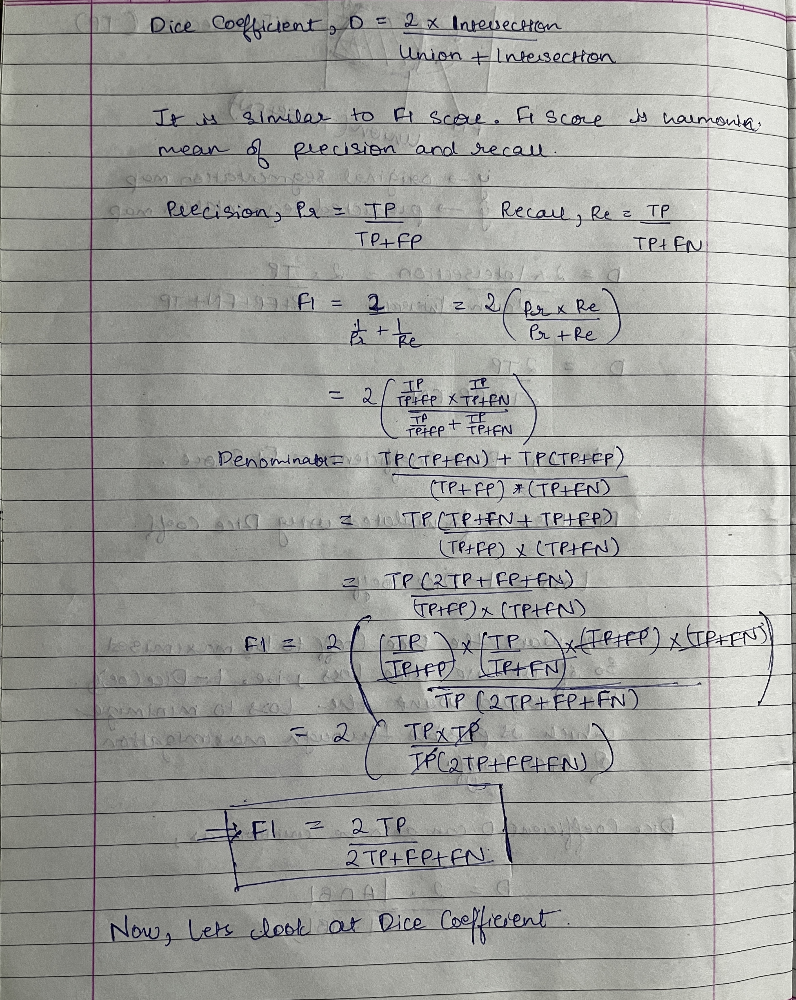

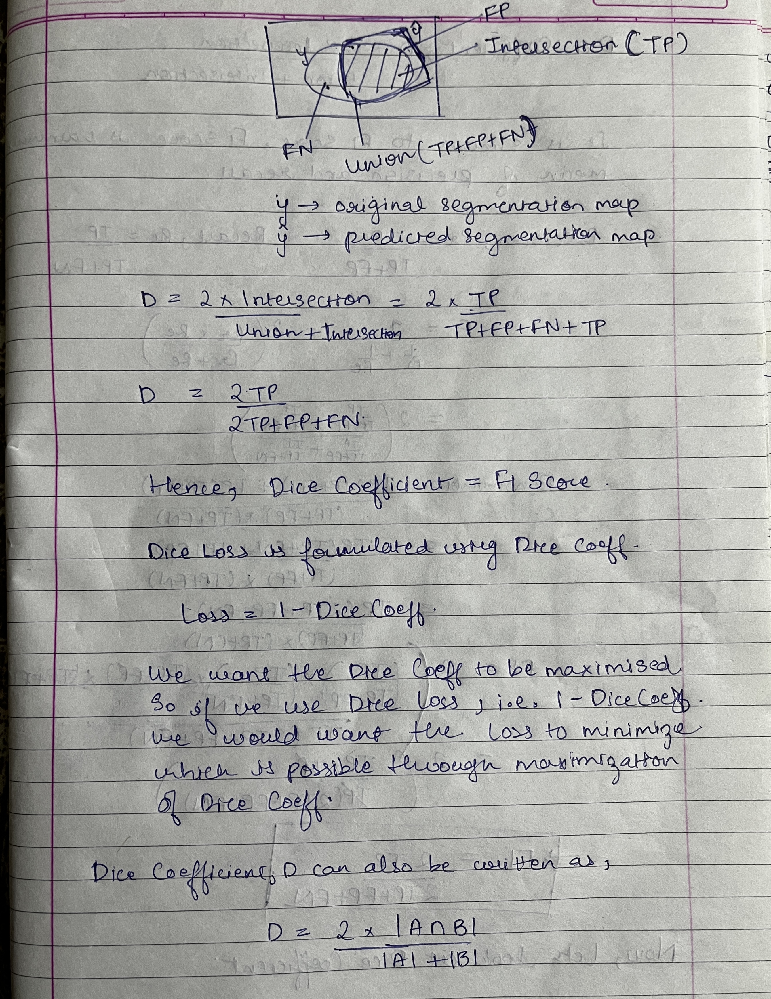

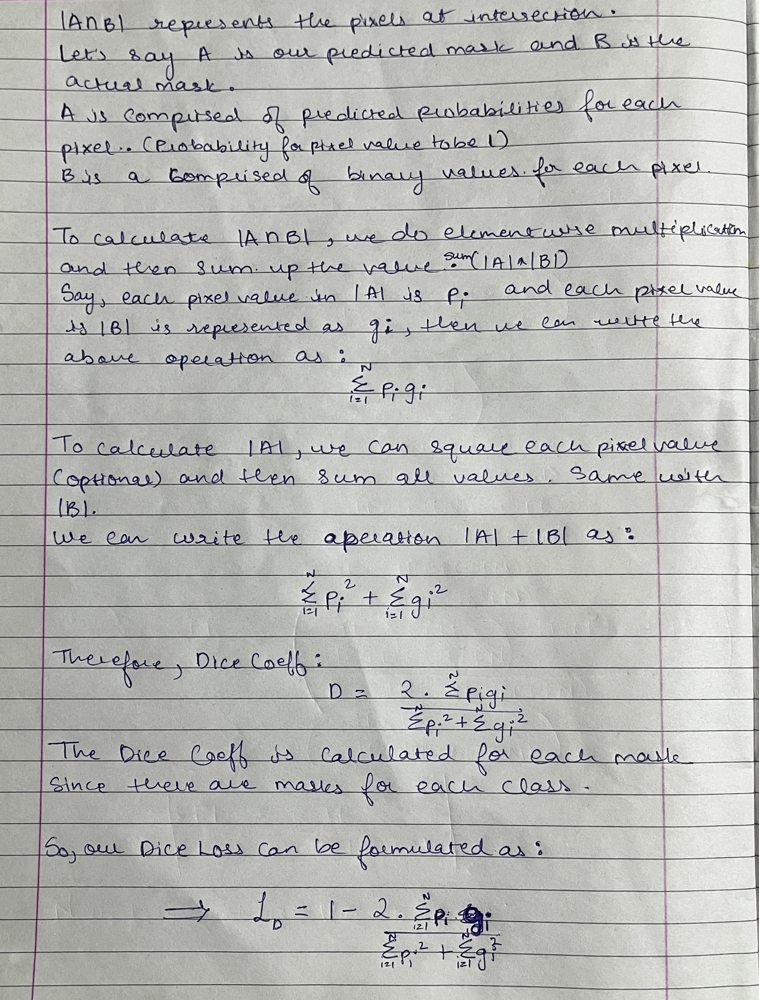

2. Range of Dice Loss: 

- The Dice Loss ranges between [0,1].

- When predicted mask and actual mask are completely overlapping,
union = intersection. Therefore, 
Dice Coeff = (2 x intersection)/(intersection + union) = (2 x intersection)/(2 x intersection) = 1 and Loss = 1 - Dice Coeff = 0.

- When predicted mask and actual mask do not overlap at all, intersection = 0.Therefore,
Dice Coeff = 0 and Dice Loss = 1 - Dice Coeff = 1.

3. Interpretation of Loss Function :

- Loss function uses a term Dice Coeff which is a measure of overlap of predicted mask and actual mask. 
- The Dice Coeff's value ranges from 0 to 1. 0 being case where predicted mask and actual mask do not overlap at all and 1 being the case where predicted mask and actual mask perfectly overlap. 
- Since Dice Loss = 1-Dice Coeff, in order to minimize the loss we need to maximize the Dice Coeff for which we need to maximize the intersection part by predicting right pixel probability values.

4. Understanding of the Loss Function, How does it help in segmentation? 

- As mentioned above, Dice Loss is made up using Dice Coeff which actually is a performance metric, higher the Dice Coeff better the performance. So we use this to create a Loss function such that whenever the Coeff value is high the loss is low and vice versa.

- This loss function helps in image segmentation as it optimizes the weights in a manner such that predicted probabilities for each pixel in the predicted mask directly relates to the binary pixel values in the actual mask which increases the area of intersection between the predicted and actual mask thereby reducing the loss and resulting in a precise predicted segmentation map for the input image.

### Task 2.2: Training Unet


<pre>
* Split the data into 80:20.
* Train the UNET on the given dataset and plot the train and validation loss.
</pre>

In [ ]:
tf.keras.backend.clear_session()
model = Unet(backbone_name = 'resnet34', encoder_weights='imagenet', encoder_freeze=True, classes = 21, activation='sigmoid',input_shape=(128,128,3))
model.summary()

85532672/85521592 [==============================] - 1s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 128, 128, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 134, 134, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)            

In [ ]:
from segmentation_models.metrics import iou_score

optim = tf.keras.optimizers.Adam(0.001)
focal_loss = sm.losses.cce_dice_loss
model.compile(optim, focal_loss, metrics=[iou_score])

In [ ]:
import datetime

In [ ]:
checkpoint_cb_dict = {}

for i in range (1,3):
    path = f'checkpoints_model_{i}' + '/weights-{epoch:02d}-{val_iou_score:.4f}.hdf5'
    checkpoint_cb_dict[i] = tf.keras.callbacks.ModelCheckpoint(filepath = path, monitor = 'val_iou_score', 
                                                save_best_only=True, verbose=0, mode='max')
    
earlystop_cb = tf.keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0.0001, 
                                                   patience=6, verbose=1, mode='max', restore_best_weights=True)

reduce_lr_cb = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_iou_score', patience = 3, factor = 0.5, mode='max', min_delta = 0.0001, min_lr=1e-7)

tensorboard_cb_dict = {}

for i in range(1,3):
    log_dir = os.path.join(f'logs_model_{i}','fits', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_cb_dict[i] = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1,write_graph=True)

In [ ]:
callbacks_list_1 = [tensorboard_cb_dict[1], checkpoint_cb_dict[1], earlystop_cb, reduce_lr_cb]

In [ ]:
history = model.fit(train_dataloader, validation_data=test_dataloader, steps_per_epoch=len(train_dataloader), epochs=25, verbose=2, callbacks=callbacks_list_1)

Epoch 1/25
721/721 - 247s - loss: 0.7882 - iou_score: 0.1949 - val_loss: 0.7657 - val_iou_score: 0.2166 - lr: 0.0010 - 247s/epoch - 342ms/step
Epoch 2/25
721/721 - 217s - loss: 0.6932 - iou_score: 0.2682 - val_loss: 0.7154 - val_iou_score: 0.2509 - lr: 0.0010 - 217s/epoch - 301ms/step
Epoch 3/25
721/721 - 217s - loss: 0.6573 - iou_score: 0.3028 - val_loss: 0.6972 - val_iou_score: 0.2672 - lr: 0.0010 - 217s/epoch - 302ms/step
Epoch 4/25
721/721 - 217s - loss: 0.6167 - iou_score: 0.3389 - val_loss: 0.5512 - val_iou_score: 0.4103 - lr: 0.0010 - 217s/epoch - 301ms/step
Epoch 5/25
721/721 - 214s - loss: 0.4763 - iou_score: 0.4806 - val_loss: 0.5354 - val_iou_score: 0.4270 - lr: 0.0010 - 214s/epoch - 297ms/step
Epoch 6/25
721/721 - 213s - loss: 0.4603 - iou_score: 0.4962 - val_loss: 0.5262 - val_iou_score: 0.4321 - lr: 0.0010 - 213s/epoch - 296ms/step
Epoch 7/25
721/721 - 213s - loss: 0.4509 - iou_score: 0.5004 - val_loss: 0.5204 - val_iou_score: 0.4370 - lr: 0.0010 - 213s/epoch - 295ms/step

In [ ]:
results = pd.DataFrame(history.history)
results.sort_values(by='val_iou_score', ascending=False, inplace=True)
results.head()

,loss,iou_score,val_loss,val_iou_score,lr
23,0.310048,0.694950,0.444097,0.512241,0.001
24,0.308361,0.657051,0.446191,0.512231,0.001
22,0.352654,0.588329,0.451764,0.508523,0.001
21,0.365216,0.575682,0.494202,0.461922,0.001
18,0.375873,0.575727,0.497146,0.461545,0.001


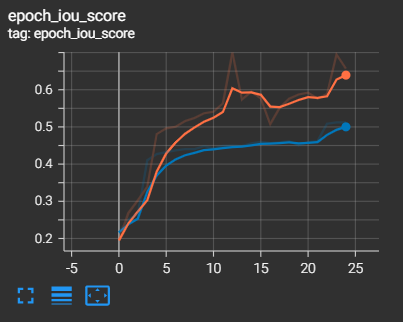

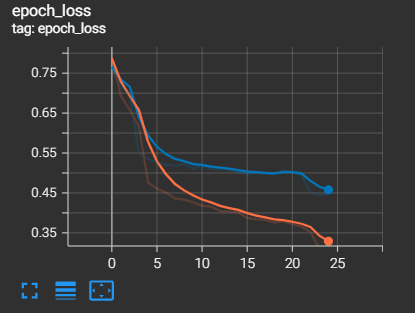

Observations: 

- Train IOU fluctuates a bit but overall follows an increasing trend and Test IOU conitnues to increase each epoch.

- Train and Test Loss continues to decrease each epoch.

- Best Model is achieved at 24th epoch : Test Loss = 0.444, Test IOU = 0.512

### Visualizing Trained Model Predicted Segmentation Maps

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/weights-24-0.5122.hdf5', custom_objects={'categorical_crossentropy_plus_dice_loss': sm.losses.cce_dice_loss, 'iou_score': iou_score})

In [ ]:
import random 
images_dir = 'data/images'
masks_dir = 'data/output'

#creating a random sample of 10 test images and corresponding actual masks
test_sample = random.sample(X_test, 10)
images_test = [os.path.join(images_dir, image_id+'_leftImg8bit.jpg') for image_id in test_sample]
masks_test  = [os.path.join(masks_dir, image_id+"_gtFine_polygons.png") for image_id in test_sample]
images_masks_test = list(zip(images_test, masks_test))

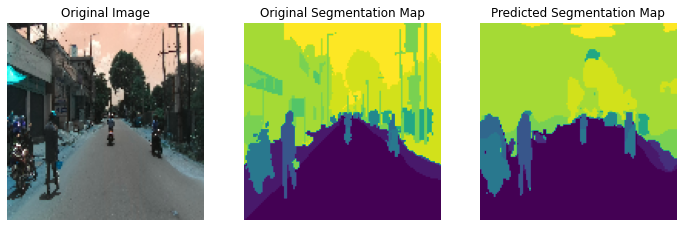

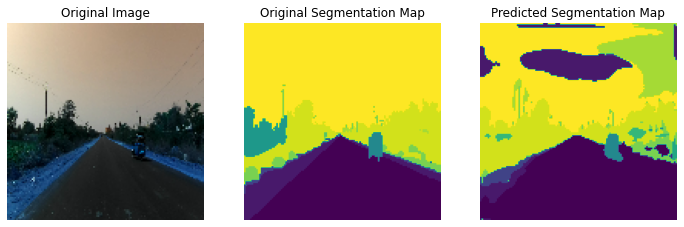

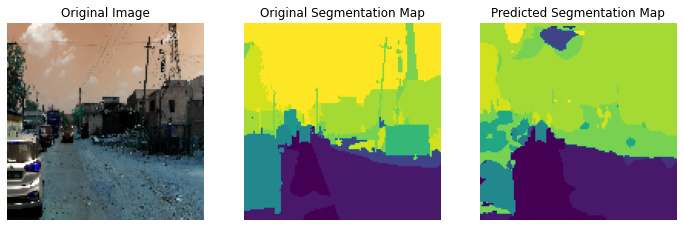

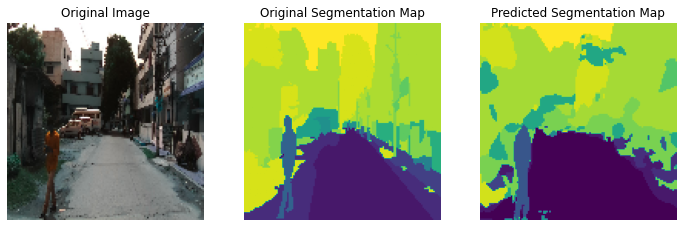

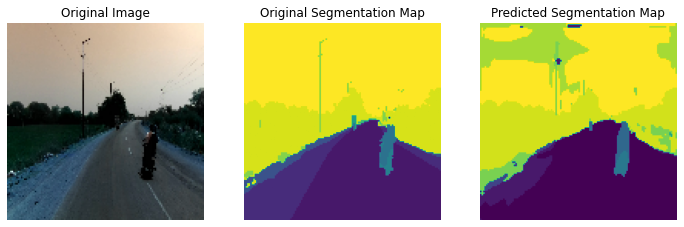

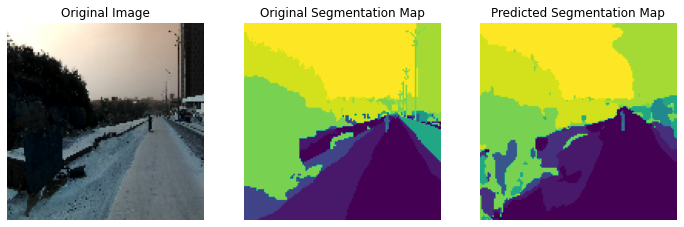

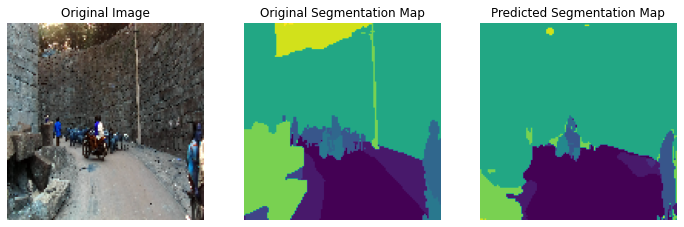

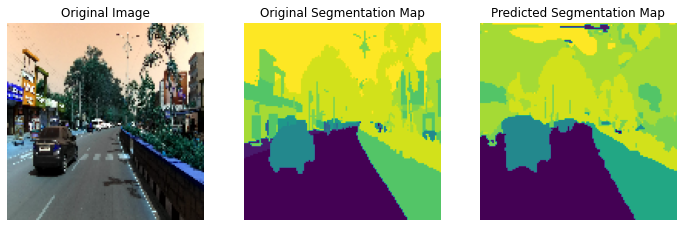

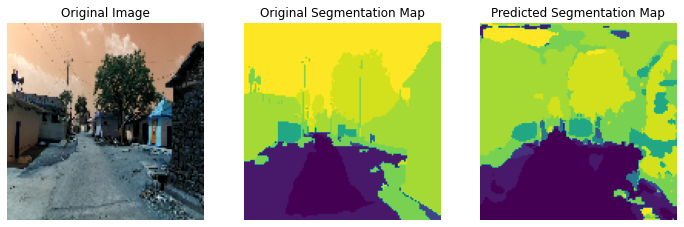

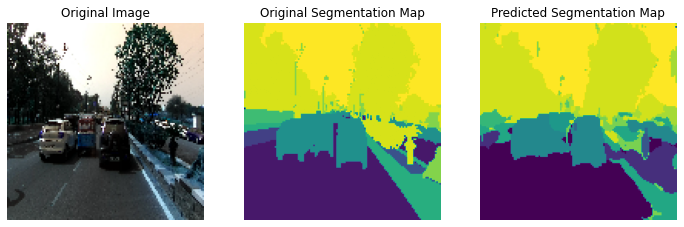

In [ ]:
for img, msk in images_masks_test:
    #original image
    image = cv2.imread(img, cv2.IMREAD_UNCHANGED)
    image = cv2.resize(image, (128,128), interpolation=cv2.INTER_NEAREST) 

    #original segmentation map
    actual_mask = cv2.imread(msk, cv2.IMREAD_UNCHANGED)
    actual_mask = cv2.resize(actual_mask, (128,128), interpolation=cv2.INTER_NEAREST)

    #predicted segmentation map
    pred_mask = model.predict(image[np.newaxis,:,:,:])
    pred_mask = (np.argmax(pred_mask, axis=-1))*10

    plt.figure(figsize=(12,5))

    plt.subplot(131)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')
    

    plt.subplot(132)
    plt.imshow(actual_mask)
    plt.title('Original Segmentation Map')
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(pred_mask[0])
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.show()

# Task 3: Training CANet

In [ ]:
import tensorflow as tf
# tf.compat.v1.enable_eager_execution()
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import UpSampling2D
from tensorflow.keras.layers import MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Multiply
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Reshape, Concatenate, GlobalMaxPool2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.initializers import glorot_uniform
K.set_image_data_format('channels_last')
K.set_learning_phase(1)

/usr/local/lib/python3.7/dist-packages/keras/backend.py:450: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


* Implementing the architecture based on this paper https://arxiv.org/pdf/2002.12041.pdf
* We will be using the custom layers concept
* We divide the whole architecture into two parts
    1. Encoder
    2. Decoder
    <img src='https://i.imgur.com/prH3Mno.png' width="600">
* Encoder:
    * The first step of the encoder is to create the channel maps [$C_1$, $C_2$, $C_3$, $C_4$]
    * $C_1$ width and heigths are 4x times less than the original image
    * $C_2$ width and heigths are 8x times less than the original image
    * $C_3$ width and heigths are 8x times less than the original image
    * $C_4$ width and heigths are 8x times less than the original image
    * <i>you can reduce the dimensions by using stride parameter</i>.
    * [$C_1$, $C_2$, $C_3$, $C_4$] are formed by applying a "conv block" followed by $k$ number of "identity block". i.e the $C_k$ feature map will single "conv block" followed by $k$ number of "identity blocks".
    <table>
    <tr><td><img src="https://i.imgur.com/R8Gdypo.png" width="300"></td>
        <td><img src="https://i.imgur.com/KNunjQK.png" width="250"></td></tr>
    </table>
    * <strong>The conv block and identity block of $C_1$</strong>: the number filters in the covolutional layers will be $[4,4,8]$ and the number of filters in the parallel conv layer will also be $8$.
    * <strong>The conv block and identity block of $C_2$</strong>: the number filters in the covolutional layers will be $[8,8,16]$ and the number of filters in the parallel conv layer will also be $16$.
    * <strong>The conv block and identity block of $C_3$</strong>: the number filters in the covolutional layers will be $[16,16,32]$ and the number of filters in the parallel conv layer will also be $32$.
    * <strong>The conv block and identity block of $C_4$</strong>: the number filters in the covolutional layers will be $[32,32,64]$ and the number of filters in the parallel conv layer will also be $64$.
    * Here $\oplus$ represents the elementwise sum
    <br>
    
    <font color="red">NOTE: these filters are of our choice we can explore more options also</font>
    
    * Example: if your image is of size $(512, 512, 3)$
        * the output after $C_1$ will be $128*128*8$
        * the output after $C_2$ will be $64*64*16$
        * the output after $C_3$ will be $64*64*32$
        * the output after $C_4$ will be $64*64*64$

In [ ]:
class convolutional_block(tf.keras.layers.Layer):
    def __init__(self, kernel=3,  filters=[4,4,8], stride=1, name="conv block", **kwargs):
        super().__init__(name=name, **kwargs)
        self.F1, self.F2, self.F3 = filters
        self.kernel = kernel
        self.stride = stride

        
        self.conv2d_1 = Conv2D(filters=self.F1, kernel_size=1, strides=1, padding='valid',activation='relu', name=name+'_c_1')
        self.batch_norm_1 = BatchNormalization(name=name+'_bn_1')

        self.conv2d_2 = Conv2D(filters=self.F2, kernel_size=self.kernel, strides=self.stride, padding='same',activation='relu', name=name+'_c_2') 
        self.batch_norm_2 = BatchNormalization(name=name+'_bn_2')

        self.conv2d_3 = Conv2D(filters=self.F3, kernel_size=1, strides=1, padding='valid',activation='relu', name=name+'_c_3')
        self.batch_norm_3 = BatchNormalization(name=name+'_bn_3')


        self.conv2d_4 = Conv2D(filters=self.F3, kernel_size=self.kernel, strides=self.stride, padding='same',activation='relu', name=name+'_c_4')
        self.batch_norm_4 = BatchNormalization(name=name+'_bn_4')

        self.add = Add()

        self.activation = Activation('relu',name=name+'_avn')


    def call(self, X):
        # write the architecutre that was mentioned above
        X_parallel = X
        
        X = self.conv2d_1(X)
        X = self.batch_norm_1(X)
        X = self.activation(X)

        X = self.conv2d_2(X)
        X = self.batch_norm_2(X)
        X = self.activation(X)

        X = self.conv2d_3(X)
        X = self.batch_norm_3(X)

        X_parallel = self.conv2d_4(X_parallel)
        X_parallel = self.batch_norm_4(X_parallel)
        X_parallel = self.activation(X_parallel)

        X = self.add([X, X_parallel])

        X = self.activation(X)

        return X

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'kernel': self.kernel,
            'filters': [self.F1, self.F2, self.F3],
            'stride': self.stride,
        })
        return config

In [ ]:
class identity_block(tf.keras.layers.Layer):
    def __init__(self, kernel=3,  filters=[4,4,8], name="identity block",**kwargs):
        super().__init__(name=name,**kwargs)
        self.F1, self.F2, self.F3 = filters
        self.kernel = kernel

        self.conv2d_1 = Conv2D(filters=self.F1, kernel_size=1, strides=1, padding='valid',activation='relu', name=name+'_c_1')
        self.batch_norm_1 = BatchNormalization(name=name+'_bn_1')

        self.conv2d_2 = Conv2D(filters=self.F2, kernel_size=self.kernel, strides=1, padding='same', activation='relu',name=name+'_c_2')
        self.batch_norm_2 = BatchNormalization(name=name+'_bn_2')

        self.conv2d_3 = Conv2D(filters=self.F3, kernel_size=1, strides=1, padding='valid', activation='relu',name=name+'_c_3')
        self.batch_norm_3 = BatchNormalization(name=name+'_bn_3')

        self.activation = Activation('relu', name=name+'_avn')

        self.add = Add()

    def call(self, X):
        # write the architecutre that was mentioned above
        X_parallel = X

        X = self.conv2d_1(X)
        X = self.batch_norm_1(X)
        X = self.activation(X)

        X = self.conv2d_2(X)
        X = self.batch_norm_2(X)
        X = self.activation(X)

        X = self.conv2d_3(X)
        X = self.batch_norm_3(X)

        X = self.add([X, X_parallel])

        X = self.activation(X)
        return X
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'kernel': self.kernel,
            'filters': [self.F1, self.F2, self.F3],
        })
        return config

* The output of the $C_4$ will be passed to $\text{Chained Context Aggregation Module (CAM)}$
<img src='https://i.imgur.com/Bu63AAA.png' width="400">
* The CAM module will have two operations names Context flow and Global flow
* <strong>The Global flow</strong>: 
    * as shown in the above figure first we willl apply  <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/GlobalAveragePooling2D">global avg pooling</a> which results in (#, 1, 1, number_of_filters) then applying <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/BatchNormalization?version=nightly">BN</a>, <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU">RELU</a>, $1*1 \text{ Conv}$ layer sequentially which results a matrix (#, 1, 1, number_of_filters). Finally apply <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/UpSampling2D">upsampling</a> / <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose">conv2d transpose</a> to make the output same as the input dimensions (#, input_height, input_width, number_of_filters)
    * If you use <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/UpSampling2D">upsampling</a> then use bilinear pooling as interpolation technique
* <strong>The Context flow</strong>: 
    * as shown in the above figure (c) the context flow will get inputs from two modules `a. C4` `b. From the above flow` 
    * We will be <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/Concatenate">concatinating</a> the both inputs on the last axis.
    * After the concatination we will be applying <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/AveragePooling2D"> Average pooling </a> which reduces the size of feature map by $N\times$ times
    * In the paper it was mentioned that to apply a group convolutions, but for the assignment we will be applying the simple conv layers with kernel size $(3*3)$
    * We are skipping the channel shuffling 
    * similarly we will be applying a simple conv layers with kernel size $(3*3)$ consider this output is X
    * later we will get the Y=(X $\otimes \sigma((1\times1)conv(relu((1\times1)conv(X))))) \oplus X$, here $\oplus$ is elementwise addition and $\otimes$ is elementwise multiplication
    * Finally apply <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/UpSampling2D">upsampling</a> / <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose">conv2d transpose</a> to make the output same as the input dimensions (#, input_height, input_width, number_of_filters)
    * If you use <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/UpSampling2D">upsampling</a> then use bilinear pooling as interpolation technique

NOTE: here N times reduction and N time increments makes the input and out shape same, you can explore with the N values, you can choose N = 2 or 4

* Example with N=2:
    * Assume the C4 is of shape (64,64,64) then the shape of GF will be (64,64,32)
    * Assume the C4 is of shape (64,64,64) and the shape of GF is (64,64,32) then the shape of CF1 will be (64,64,32)
    * Assume the C4 is of shape (64,64,64) and the shape of CF1 is (64,64,32) then the shape of CF2 will be (64,64,32)
    * Assume the C4 is of shape (64,64,64) and the shape of CF2 is (64,64,32) then the shape of CF3 will be (64,64,32)

In [ ]:
class global_flow(tf.keras.layers.Layer):
    def __init__(self, name="global_flow",**kwargs):
        super().__init__(name=name,**kwargs)
        self.global_avg = GlobalAveragePooling2D(name=name+'_g_avg')
        self.reshape = Reshape(target_shape=(1,1,64), name = name+'_reshape')
        self.batch_norm = BatchNormalization(name = name+'_bn')
        self.activation = Activation('relu', name=name+'_avn')
        self.conv2d = Conv2D(filters=32, kernel_size=1, strides=1, padding='valid',activation='relu', name=name+'_conv') 
        self.upsample = UpSampling2D(size = (16,16), interpolation='bilinear', name=name+'_upsam') #upsample size here depends on the input image size
        
    def call(self, X):
        # implement the global flow operation
        X = self.global_avg(X)
        X = self.reshape(X)
        X = self.batch_norm(X)
        X = self.activation(X)
        X = self.conv2d(X)
        X = self.upsample(X)
        return X

In [ ]:
class context_flow(tf.keras.layers.Layer):    
    def __init__(self, name="context_flow",**kwargs):
        super().__init__(name=name,**kwargs)
        self.concat = Concatenate(name = name+'_concat') 
        self.avg_pool = AveragePooling2D(pool_size=(2,2), strides=2, padding='valid',name = name+'_avgpool') 
        self.conv2d_1 = Conv2D(filters=32, kernel_size=3, strides=1, padding='same',activation='relu',name = name+'_c_1')
        self.conv2d_2 = Conv2D(filters=32, kernel_size=3, strides=1, padding='same',activation='relu',name = name+'_c_2') 
        
        self.conv2d_3 = Conv2D(filters=32, kernel_size=1, strides=1, padding='same', activation='relu',name = name+'_c_3') 
        self.activation_1 = Activation('relu', name = name+'_avn_1')
        self.conv2d_4 = Conv2D(filters=32, kernel_size=1, strides=1, padding='same', activation='relu',name = name+'_c_4') 
        self.activation_2 = Activation('sigmoid', name = name+'_avn_2')

        self.mul = Multiply(name=name+'_mul')
        self.add = Add(name=name+'_add')

        self.upsample = UpSampling2D(size = (2,2), interpolation='bilinear', name=name+'_upsam') 

    def call(self, X):
        # here X will a list of two elements 
        INP, FLOW = X[0], X[1] 
        # implement the context flow as mentioned in the above cell
        X = self.concat([INP, FLOW])
        X = self.avg_pool(X)
        X = self.conv2d_1(X)
        X = self.conv2d_2(X)

        X_parallel = X

        X = self.conv2d_3(X)
        X = self.activation_1(X)
        
        X = self.conv2d_4(X)
        X = self.activation_2(X)

        X = self.mul([X, X_parallel])
        X = self.add([X, X_parallel])

        X = self.upsample(X)
        return X

* As shown in the above architecture we will be having 4 context flows
* if you have implemented correctly all the shapes of Global Flow, and 3 context flows will have the same dimension
* the output of these 4 modules will be <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/Add">added</a> to get the same output matrix
<img src='https://i.imgur.com/Bu63AAA.png' width="400">
 
* The output of after the sum, will be sent to the <strong>Feature selection module $FSM$</strong>
 
* Example:
    * if the shapes of GF, CF1, CF2, CF3 are (64,64,32), (64,64,32), (64,64,32), (64,64,32), (64,64,32) respectivly then after the sum we will be getting (64,64,32), which will be passed to the next module.
 
<strong>Feature selection module</strong>:

* As part of the FSM we will be applying a conv layer (3,3) with the padding="same" so that the output and input will have same shapes
* Let call the output as X
* Pass the X to global pooling which results the matrix (#, 1, 1, number_of_channels)
* Apply $1*1$ conv layer, after the pooling
* the output of the $1*1$ conv layer will be passed to the Batch normalization layer, followed by Sigmoid activation function.
* we will be having the output matrix of shape (#, 1, 1, number_of_channels) lets call it 'Y'
* <strong>we can interpret this as attention mechanisum, i.e for each channel we will having a weight</strong>
* the dimension of X (#, w, h, k) and output above steps Y is (#, 1, 1, k) i.e we need to multiply each channel of X will be <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/Multiply">multiplied</a> with corresponding channel of Y
* After creating the weighted channel map we will be doing upsampling such that it will double the height and width.
* apply <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/UpSampling2D">upsampling</a> with bilinear pooling as interpolation technique

* <font color="red">Example</font>:
    * Assume the matrix shape of the input is (64,64,32) then after upsampling it will be (128,128,32)

In [ ]:
class fsm(tf.keras.layers.Layer):    
    def __init__(self, name="feature_selection",**kwargs):
        super().__init__(name=name,**kwargs)
        self.conv2d_1 = Conv2D(filters=32, kernel_size=3, strides=1, padding='same',activation='relu', name=name+'_c_1') 

        self.global_max = GlobalMaxPool2D(name=name+'_g_maxpool') 
        self.reshape = Reshape(target_shape=(1,1,32), name=name+'_reshape') 
        self.conv2d_2 = Conv2D(filters=32, kernel_size=1, strides=1, padding='valid', activation='relu',name=name+'_c_2') 
        self.batch_norm = BatchNormalization(name=name+'_bn')
        self.activation = Activation('sigmoid', name=name+'avn')

        self.mul = Multiply(name=name+'_mul')

        self.upsample = UpSampling2D(size = (2,2), interpolation='bilinear', name=name+'_upsam') 
        
    def call(self, X):
        # implement the FSM modules based on image in the above cells
        X = self.conv2d_1(X)
        
        X_parallel = X

        X = self.global_max(X)
        X = self.reshape(X)
        X = self.conv2d_2(X)
        X = self.batch_norm(X)
        X = self.activation(X)

        X = self.mul([X,X_parallel]) 

        FSM_Conv_T = self.upsample(X)

        return FSM_Conv_T

* <b>Adapted Global Convolutional Network (AGCN)</b>:
    <img src="https://i.imgur.com/QNB8RmV.png" width="300">
    
    * AGCN will get the input from the output of the "conv block" of $C_1$
    
    * In all the above layers we will be using the padding="same" and stride=(1,1)
    
    * so that we can have the input and output matrices of same size
    
* <font color="red">Example</font>:
    * Assume the matrix shape of the input is (128,128,32) then the output it will be (128,128,32)

In [ ]:
class agcn(tf.keras.layers.Layer):    
    def __init__(self, name= 'global_conv_net',**kwargs):
        super().__init__(name=name,**kwargs)
        self.conv2d_1 =  Conv2D(filters=32, kernel_size=(7,1), strides=1, padding='same',activation='relu',name=name+'_c_1')
        self.conv2d_2 =  Conv2D(filters=32, kernel_size=(1,7), strides=1, padding='same',activation='relu',name=name+'_c_2')
        self.conv2d_3 =  Conv2D(filters=32, kernel_size=(1,7), strides=1, padding='same',activation='relu',name=name+'_c_3')
        self.conv2d_4 =  Conv2D(filters=32, kernel_size=(7,1), strides=1, padding='same',activation='relu',name=name+'_c_4')
        self.conv2d_5 =  Conv2D(filters=32, kernel_size=3, strides=1, padding='same',activation='relu',name=name+'_c_5')
        self.add = Add(name=name+'_add')
    
    def call(self, X):
        # please implement the above mentioned architecture
        X_parallel = X 

        X = self.conv2d_1(X)
        X = self.conv2d_2(X)
        
        X_parallel = self.conv2d_3(X_parallel)
        X_parallel = self.conv2d_4(X_parallel)

        X = self.add([X, X_parallel])
        X_parallel = X 

        X = self.conv2d_5(X)
        X = self.add([X,X_parallel])
        return X

*     <img src='https://i.imgur.com/prH3Mno.png' width="600">
* as shown in the architecture, after we get the AGCN it will get concatinated with the FSM output

* If we observe the shapes both AGCN and FSM will have same height and weight

* we will be concatinating both these outputs over the last axis

* The concatinated output will be passed to a conv layers with filters = number of classes in our data set and the activation function = 'relu'

* we will be using padding="same" which results in the same size feature map

* If you observe the shape of matrix, it will be 4x times less than the original image

* to make it equal to the original output shape, we will do 4x times upsampling of rows and columns

* apply <a href="https://www.tensorflow.org/api_docs/python/tf/keras/layers/UpSampling2D">upsampling</a> with bilinear pooling as interpolation technique

* Finally we will be applying sigmoid activation.

* Example:
    * Assume the matrix shape of AGCN is (128,128,32)  and FSM is (128,128,32) the concatination will make it (128, 128, 64)
    * Applying conv layer will make it (128,128,21)
    * Finally applying upsampling will make it (512, 512, 21)
    * Applying sigmoid will result in the same matrix (512, 512, 21)

In [ ]:
#set seed for reproducability
tf.keras.utils.set_random_seed(0)
tf.keras.backend.clear_session()

input_layer = Input(shape=(128,128,3)) 

# Stage 0
X = Conv2D(64, (3, 3), name='conv1', padding="same", activation='relu',kernel_initializer=glorot_uniform(seed=0))(input_layer)
X = BatchNormalization(axis=3, name='bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((2, 2), strides=(2, 2))(X)

#Stage 1
X = convolutional_block(kernel=3,  filters=[4,4,8], stride=2, name="conv_block_1")(X)
X_C1 = X #32,32,8
X = identity_block(kernel=3,  filters=[4,4,8], name="identity_block_1")(X)

#Stage 2
X = convolutional_block(kernel=3,  filters=[8,8,16], stride=2, name="conv_block_2")(X)
X = identity_block(kernel=3,  filters=[8,8,16], name="identity_block_21")(X)
X = identity_block(kernel=3,  filters=[8,8,16], name="identity_block_22")(X)

#Stage 3
X = convolutional_block(kernel=3,  filters=[16,16,32], stride=1, name="conv_block_3")(X)
X = identity_block(kernel=3,  filters=[16,16,32], name="identity_block_31")(X)
X = identity_block(kernel=3,  filters=[16,16,32], name="identit_block_32")(X)
X = identity_block(kernel=3,  filters=[16,16,32], name="identity_block_33")(X)

#Stage 4
X = convolutional_block(kernel=3,  filters=[32,32,64], stride=1, name="conv_block_4")(X)
X = identity_block(kernel=3,  filters=[32,32,64], name="identity_block_41")(X)
X = identity_block(kernel=3,  filters=[32,32,64], name="identity_block_42")(X)
X = identity_block(kernel=3,  filters=[32,32,64], name="identity_block_43")(X)
X = identity_block(kernel=3,  filters=[32,32,64], name="identity_block_44")(X)

#CAM
X_C4 = X
X = global_flow(name='global_flow')(X)
X_GF = X
X = context_flow(name = 'context_flow_1')([X_GF, X_C4])
X_CF1 = X
X = context_flow(name = 'context_flow_2')([X_CF1, X_C4])
X_CF2 = X
X = context_flow(name = 'context_flow_3')([X_CF2, X_C4])
X_CF3 = X

X = Add()([X_GF, X_CF1, X_CF2, X_CF3])

# FSM
X_FSM = fsm()(X)

#AGCN
X_AGCN = agcn()(X_C1)

#Concat, Convolve, Upsample
X = Concatenate()([X_FSM, X_AGCN])

#additional block
X = Conv2D(64, (3,3), activation="relu", padding="same")(X)
X = BatchNormalization()(X)
X = Conv2D(128, (3,3), activation="relu", padding="same")(X)
X = BatchNormalization()(X)
X = Conv2D(256, (3,3), activation="relu", padding="same")(X)
X = BatchNormalization()(X)

X = Conv2D(21, (3, 3), name='conv_last', padding="same",activation='relu')(X)
X = UpSampling2D(size = (4,4))(X)

output_layer = Activation('softmax')(X)


print(input_layer.shape, output_layer.shape)

model_2 = Model(inputs = input_layer, outputs = output_layer)

model_2.summary()

(None, 128, 128, 3) (None, 128, 128, 21)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1 (Conv2D)                 (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_conv1 (BatchNormalization)  (None, 128, 128, 64  256         ['conv1[0][0]']                  
                                )                    

In [ ]:
optim = tf.keras.optimizers.Adam(0.01)
focal_loss = sm.losses.cce_dice_loss
model_2.compile(optim, focal_loss, metrics=[iou_score])

* Note: In the arcitecture we are creating a feature map with 2x time less width and height


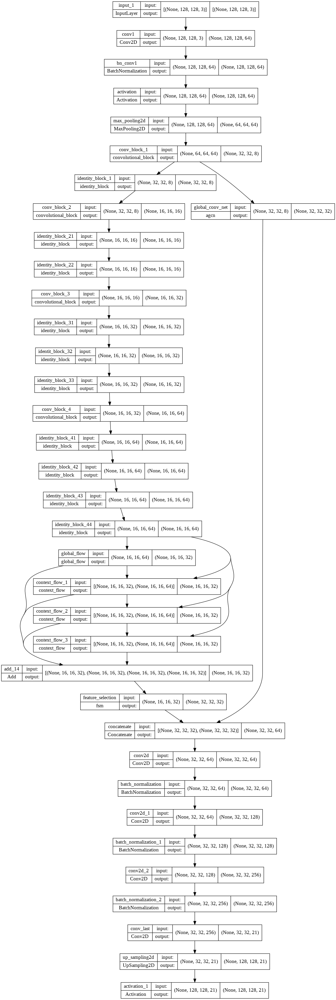

In [ ]:
tf.keras.utils.plot_model(
    model_2, to_file='model2.png', show_shapes=True, show_layer_names=True,
    rankdir='TB')

In [ ]:
# Dataset for train and test images
images_dir = 'data/images'
masks_dir = 'data/output'
train_dataset_2 = Dataset(images_dir = images_dir, masks_dir = masks_dir, file_names = X_train, width = 128, height=128, augment=True)
test_dataset_2  = Dataset(images_dir = images_dir, masks_dir = masks_dir, file_names = X_test, width = 128, height=128, augment=False)

train_dataloader_2 = Dataloder(train_dataset_2, batch_size=5, shuffle=True)
test_dataloader_2 = Dataloder(test_dataset_2, batch_size=5, shuffle=True)

print(train_dataloader_2[0][0].shape, train_dataloader_2[0][1].shape)

(5, 128, 128, 3) (5, 128, 128, 21)


In [ ]:
#changing earlystop_cb and reduce_lr_cb settings for CANET Model
earlystop_cb = tf.keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0.0001, 
                                                   patience=5, verbose=1, mode='max', restore_best_weights=True)

reduce_lr_cb = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_iou_score', patience = 2, factor = 0.5, mode='max', min_delta = 0.0001, min_lr=1e-7)

callbacks_list_2 = [tensorboard_cb_dict[2], checkpoint_cb_dict[2], earlystop_cb, reduce_lr_cb]

In [ ]:
history_2 = model_2.fit(train_dataloader_2, validation_data=test_dataloader_2, steps_per_epoch=len(train_dataloader_2), epochs=50, verbose=2, callbacks=callbacks_list_2)

Epoch 1/50
721/721 - 209s - loss: 0.9827 - iou_score: 0.0777 - val_loss: 0.9461 - val_iou_score: 0.0937 - lr: 0.0100 - 209s/epoch - 290ms/step
Epoch 2/50
721/721 - 199s - loss: 0.9063 - iou_score: 0.1109 - val_loss: 0.8876 - val_iou_score: 0.1304 - lr: 0.0100 - 199s/epoch - 275ms/step
Epoch 3/50
721/721 - 198s - loss: 0.8701 - iou_score: 0.1383 - val_loss: 0.9931 - val_iou_score: 0.1125 - lr: 0.0100 - 198s/epoch - 274ms/step
Epoch 4/50
721/721 - 200s - loss: 0.8513 - iou_score: 0.1505 - val_loss: 0.8397 - val_iou_score: 0.1598 - lr: 0.0100 - 200s/epoch - 277ms/step
Epoch 5/50
721/721 - 199s - loss: 0.8366 - iou_score: 0.1603 - val_loss: 0.8563 - val_iou_score: 0.1606 - lr: 0.0100 - 199s/epoch - 275ms/step
Epoch 6/50
721/721 - 199s - loss: 0.8237 - iou_score: 0.1706 - val_loss: 0.8435 - val_iou_score: 0.1682 - lr: 0.0100 - 199s/epoch - 276ms/step
Epoch 7/50
721/721 - 198s - loss: 0.8115 - iou_score: 0.1784 - val_loss: 0.8545 - val_iou_score: 0.1643 - lr: 0.0100 - 198s/epoch - 275ms/step

In [ ]:
res_2 = pd.DataFrame(history_2.history)
res_2.sort_values(by='val_iou_score', ascending=False, inplace=True)
res_2.head()

,loss,iou_score,val_loss,val_iou_score,lr
35,0.502418,0.456288,0.528146,0.442176,0.000156
40,0.499656,0.457040,0.529617,0.441504,0.000039
36,0.501795,0.455994,0.530541,0.441088,0.000156
39,0.501426,0.455690,0.530015,0.441086,0.000078
34,0.500808,0.457832,0.530316,0.440973,0.000156


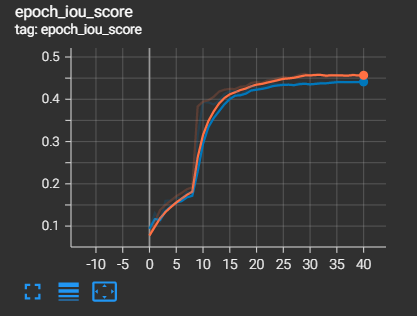

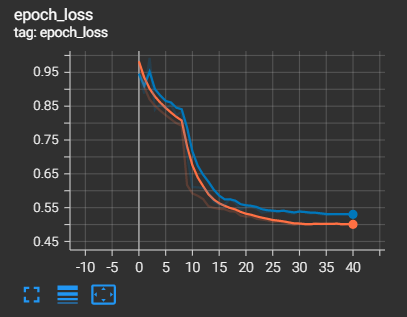

Observations: 

- Train and Test IOU increase slow initially then are increased by a considerable amount at 10th epoch and continue to follow a gradually increasing trend from there on. This indicates that the model has found an optimised set of weight values.

- Similarly Train and Test Loss decrease slowly initially then are decreased by a considerable amount at 10th epoch and continue to follow a gradually decreasing trend from there on.

- Best Model is achieved at 36th epoch : Test Loss = 0.528, Test IOU = 0.442

### Visualizing Trained Model Predicted Segmentation Maps

In [ ]:
model_2 = tf.keras.models.load_model('/content/drive/MyDrive/weights-36-0.4422.hdf5', 
                                     custom_objects={'categorical_crossentropy_plus_dice_loss': sm.losses.cce_dice_loss, 'iou_score': iou_score, 
                                                      'convolutional_block':convolutional_block, 'identity_block':identity_block,
                                                       'global_flow':global_flow, 'context_flow':context_flow, 'fsm':fsm, 'agcn':agcn})

In [ ]:
#creating a random sample of 10 test images and corresponding actual masks
test_sample = random.sample(X_test, 10)
images_test = [os.path.join(images_dir, image_id+'_leftImg8bit.jpg') for image_id in test_sample]
masks_test  = [os.path.join(masks_dir, image_id+"_gtFine_polygons.png") for image_id in test_sample]
images_masks_test = list(zip(images_test, masks_test))

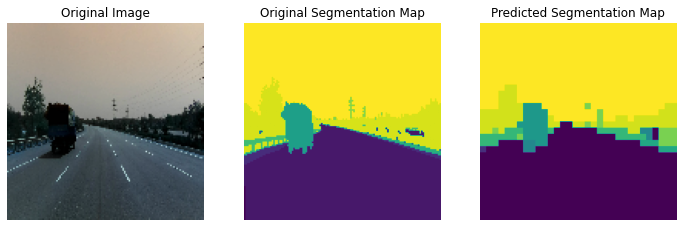

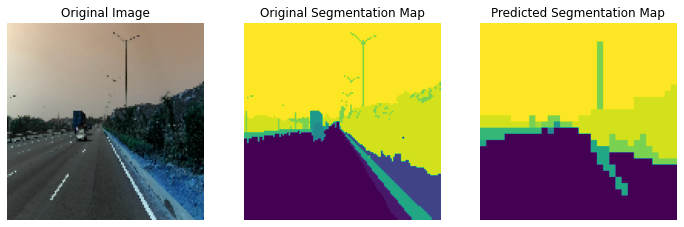

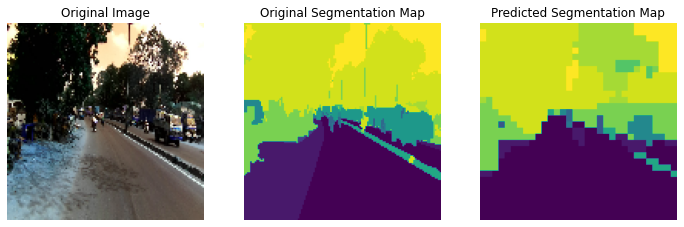

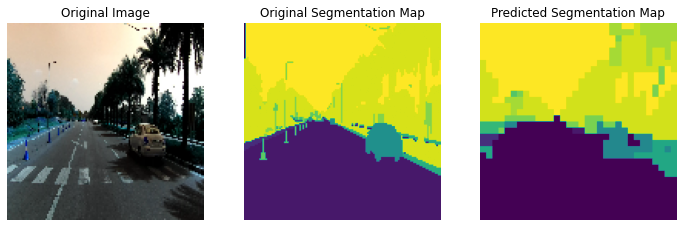

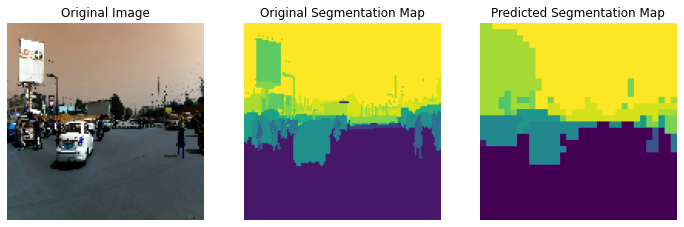

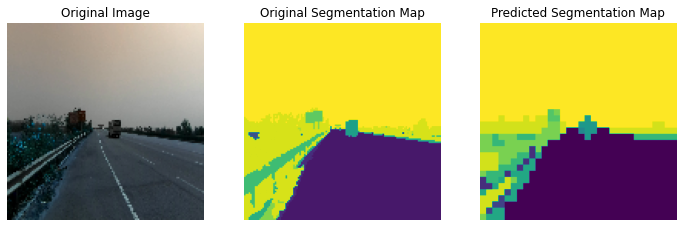

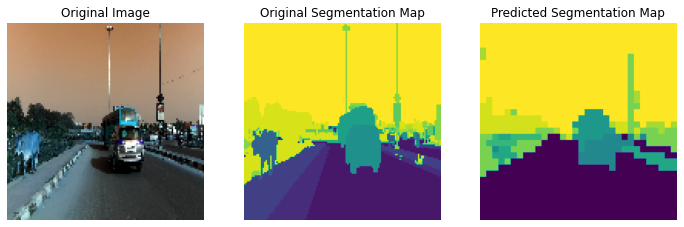

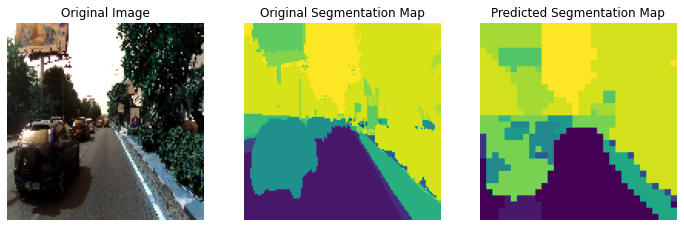

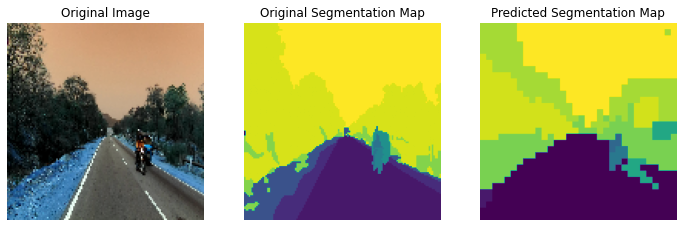

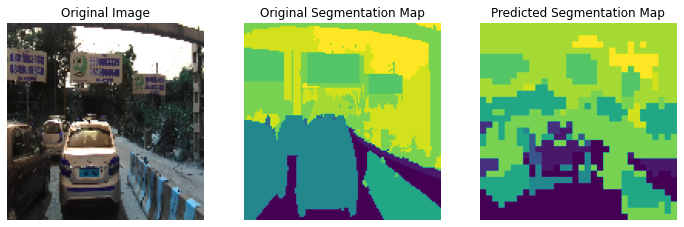

In [ ]:
for img, msk in images_masks_test:
    #original image
    image = cv2.imread(img, cv2.IMREAD_UNCHANGED)
    image = cv2.resize(image, (128,128), interpolation=cv2.INTER_NEAREST) 

    #original segmentation map
    actual_mask = cv2.imread(msk, cv2.IMREAD_UNCHANGED)
    actual_mask = cv2.resize(actual_mask, (128,128), interpolation=cv2.INTER_NEAREST)

    #predicted segmentation map
    pred_mask = model_2.predict(image[np.newaxis,:,:,:])
    pred_mask = (np.argmax(pred_mask, axis=-1))*10

    plt.figure(figsize=(12,5))

    plt.subplot(131)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')
    

    plt.subplot(132)
    plt.imshow(actual_mask)
    plt.title('Original Segmentation Map')
    plt.axis('off')
    
    plt.subplot(133)
    plt.imshow(pred_mask[0])
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.show()

# Conclusion
The U-Net outperforms CANet by a considerable margin although we can try other configurations to improve CANet's performance.